## ADHD MRI EDA
Data from WiDS Datathon 2025. Predicting gender and ADHD.
- 1213 datapoints
- labels: ADHD (0, 1-ADHD) and gender (0, 1-female)
- features: functional MRI connectome matrices (19900 cols) and patient information (socio-demographic, emotions, and parenting)

Questions:
- missingness?
    - MRI - none missing
- outliers
- correlation between labels and features?
    - highest correlation ~ 0.1 between features-target

Findings:
- original MRI data appears separable by ADHD, not by gender and potentially can be reduced from 19900 to 2600 columns
- new MRI data

In [2]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.preprocessing import StandardScaler, MinMaxScaler
import umap

import sys

sys.path.append("..")
from utils.neuroCombat import neuroCombat

## Labels

In [3]:
labels = pd.read_excel("../data/TRAIN/TRAINING_SOLUTIONS.xlsx")
conditions = [
    (labels["ADHD_Outcome"] == 1) & (labels["Sex_F"] == 1),
    (labels["ADHD_Outcome"] == 1) & (labels["Sex_F"] == 0),
    (labels["ADHD_Outcome"] == 0) & (labels["Sex_F"] == 1),
    (labels["ADHD_Outcome"] == 0) & (labels["Sex_F"] == 0),
]
values = ["ADHD_F", "ADHD_M", "norm_F", "norm_M"]


labels["dual"] = np.select(conditions, values, default="norm")
labels.head(5)

,participant_id,ADHD_Outcome,Sex_F,dual
0,UmrK0vMLopoR,1,1,ADHD_F
1,CPaeQkhcjg7d,1,0,ADHD_M
2,Nb4EetVPm3gs,1,0,ADHD_M
3,p4vPhVu91o4b,1,1,ADHD_F
4,M09PXs7arQ5E,1,1,ADHD_F


In [4]:
labels.shape

(1213, 4)

In [5]:
label_cols = ["ADHD_Outcome", "Sex_F", "dual"]
for l in label_cols:
    print(labels[l].value_counts())
    print("\n")

ADHD_Outcome
1    831
0    382
Name: count, dtype: int64


Sex_F
0    797
1    416
Name: count, dtype: int64


dual
ADHD_M    581
ADHD_F    250
norm_M    216
norm_F    166
Name: count, dtype: int64




In [6]:
palette_dual = {
    "ADHD_F": "firebrick",
    "ADHD_M": "darkgreen",
    "norm_F": "tomato",
    "norm_M": "limegreen",
}

## Scan location

1210 total - 3 data points missing

- 1=Staten Island
- 2=RUBIC
- 3=CBIC
- 4=CUNY

In [7]:
location = pd.read_excel("../data/TRAIN/TRAIN_CATEGORICAL_METADATA.xlsx")[
    ["participant_id", "MRI_Track_Scan_Location"]
]
mask_loc = location["MRI_Track_Scan_Location"].notna()
location = location[mask_loc]
location["MRI_Track_Scan_Location"] = (
    location["MRI_Track_Scan_Location"].astype(int).astype("category")
)

In [8]:
location["MRI_Track_Scan_Location"].value_counts().sort_index()

MRI_Track_Scan_Location
1    179
2    532
3    463
4     36
Name: count, dtype: int64

## Data MRI

In [9]:
mriDF = pd.read_csv("../data/TRAIN/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES.csv")
mriDF = pd.merge(labels, mriDF, how="left", on="participant_id")
mriDF = pd.merge(location, mriDF, how="left", on="participant_id")

mriDF.head(5)

,participant_id,MRI_Track_Scan_Location,ADHD_Outcome,Sex_F,dual,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,00aIpNTbG5uh,3,1,0,ADHD_M,0.361339,0.791402,0.530706,0.623133,0.845830,...,-0.047477,-0.096450,-0.280312,0.037560,0.423037,0.242453,0.336213,0.402338,0.327915,0.539032
1,00fV0OyyoLfw,2,1,0,ADHD_M,0.051430,0.613198,0.635255,0.391237,0.451225,...,-0.143218,-0.276464,-0.332783,-0.332711,0.556939,0.475578,0.429196,0.457970,0.312571,0.595978
2,04X1eiS79T4B,2,0,1,norm_F,-0.305747,0.750316,-0.005342,0.458421,0.757530,...,-0.133778,-0.108588,-0.002132,-0.175586,0.679183,0.290292,0.486680,0.255208,0.575017,0.605182
3,05ocQutkURd6,2,0,1,norm_F,0.450442,0.731530,0.799147,0.701688,0.747468,...,-0.096647,-0.041420,-0.199576,-0.216457,0.519074,0.298586,0.415466,0.511607,0.361204,0.446613
4,06YUNBA9ZRLq,2,1,0,ADHD_M,0.415220,0.585700,0.355835,0.664142,0.683491,...,-0.158995,-0.274017,-0.141012,-0.002865,0.515169,0.336139,0.316430,0.442230,0.177079,0.378278


In [10]:
mriDF.shape

(1210, 19905)

In [11]:
mri_cols = [col for col in mriDF.columns if "column" in col]

# no missingness in mri data
nan_counts = mriDF[mri_cols].isna().sum()
nan_counts.value_counts()

0    19900
Name: count, dtype: int64

In [16]:
mriDF.groupby(["MRI_Track_Scan_Location", "dual"], observed=False).agg(
    labels_per_location=("dual", "count")
).unstack(1)

labels_per_location                     
dual                                 ADHD_F ADHD_M norm_F norm_M
MRI_Track_Scan_Location                                         
1                                        30     64     42     43
2                                       112    247     70    103
3                                       103    248     52     60
4                                         5     20      1     10

### scaled

In [17]:
label_cols = [
    "participant_id",
    "ADHD_Outcome",
    "Sex_F",
    "dual",
    "MRI_Track_Scan_Location",
]

In [18]:
scaler = MinMaxScaler()
# scaler = StandardScaler()
scaled_data = scaler.fit_transform(mriDF[mri_cols])

# Create a new DataFrame with the standardized data
scaled_df = pd.DataFrame(scaled_data, columns=mri_cols)
scaled_mriDF = pd.concat([mriDF[label_cols], scaled_df], axis=1)

In [19]:
scaled_mriDF.head(5)

,participant_id,ADHD_Outcome,Sex_F,dual,MRI_Track_Scan_Location,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,00aIpNTbG5uh,1,0,ADHD_M,3,0.687405,0.897698,0.747578,0.807281,0.965119,...,0.410357,0.430496,0.250063,0.505739,0.504892,0.491194,0.643543,0.555478,0.526789,0.676845
1,00fV0OyyoLfw,1,0,ADHD_M,2,0.478219,0.740278,0.822154,0.631232,0.679217,...,0.331730,0.282576,0.206880,0.214603,0.647124,0.681308,0.710832,0.603809,0.514063,0.727355
2,04X1eiS79T4B,0,1,norm_F,2,0.237128,0.861404,0.365203,0.682236,0.901143,...,0.339482,0.420522,0.478999,0.338147,0.776973,0.530207,0.752431,0.427660,0.731737,0.735519
3,05ocQutkURd6,0,1,norm_F,2,0.747549,0.844810,0.939062,0.866918,0.893852,...,0.369976,0.475715,0.316507,0.306011,0.606903,0.536971,0.700896,0.650405,0.554399,0.594871
4,06YUNBA9ZRLq,1,0,ADHD_M,2,0.723775,0.715987,0.622838,0.838414,0.847500,...,0.318774,0.284587,0.364704,0.473954,0.602755,0.567596,0.629227,0.590135,0.401686,0.534259


/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


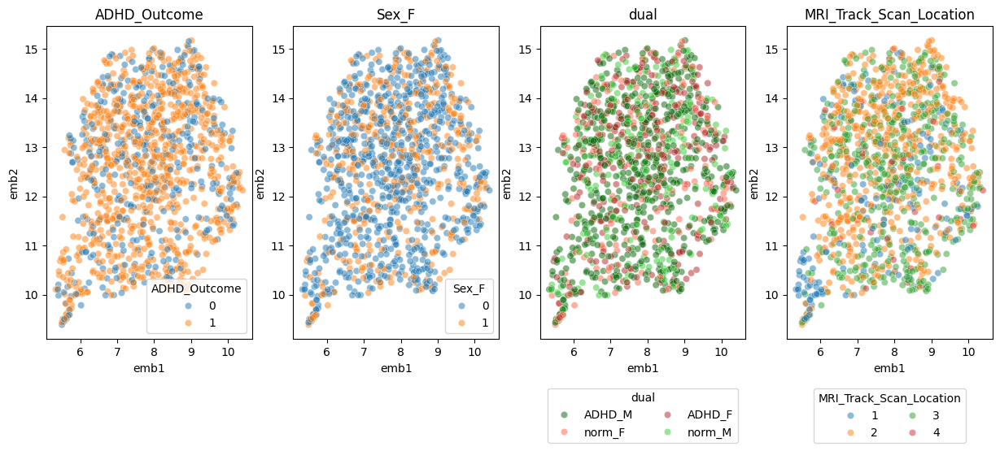

In [30]:
mri_embed = pd.DataFrame(
    umap.UMAP(random_state=12).fit_transform(scaled_mriDF[mri_cols]),
    columns=["emb1", "emb2"],
)

mri_embed[label_cols] = scaled_mriDF[label_cols]

fig, axs = plt.subplots(ncols=len(label_cols) - 1, figsize=(15, 5))
for i, label in enumerate(label_cols[1:]):
    if label == "dual":
        g = sns.scatterplot(
            data=mri_embed,
            x="emb1",
            y="emb2",
            hue=label,
            ax=axs[i],
            palette=palette_dual,
            alpha=0.5,
        )
    else:
        g = sns.scatterplot(
            data=mri_embed, x="emb1", y="emb2", hue=label, ax=axs[i], alpha=0.5
        )
    g.set_title(label)
    if i in [2, 3]:
        sns.move_legend(g, "lower center", bbox_to_anchor=(0.5, -0.35), ncol=2)

In [31]:
mri_embed = pd.DataFrame(
    umap.UMAP(random_state=12, n_components=3).fit_transform(scaled_mriDF[mri_cols]),
    columns=["emb1", "emb2", "emb3"],
)

mri_embed[label_cols] = scaled_mriDF[label_cols]

fig = px.scatter_3d(
    mri_embed,
    x="emb1",
    y="emb2",
    z="emb3",
    color="MRI_Track_Scan_Location",
    opacity=0.6,
    hover_name="dual",
)
fig.update_traces(marker_size=4)
fig.show()

/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### OLD data for comparison

/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


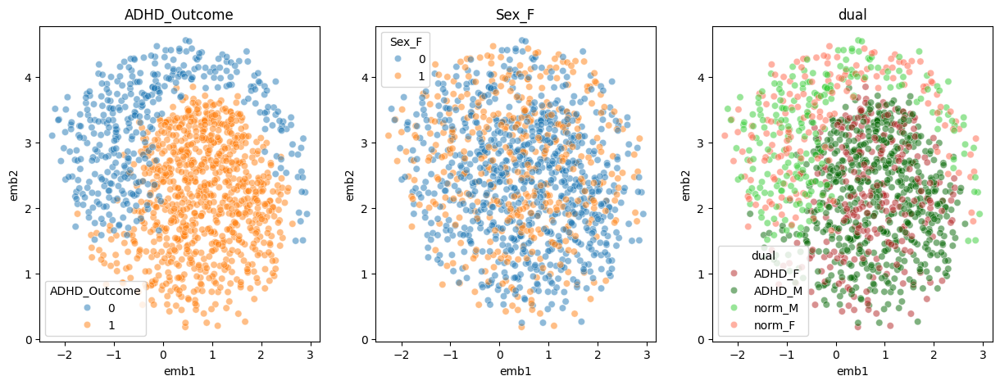

In [16]:
## OLD ##
mri_embed = pd.DataFrame(
    umap.UMAP(random_state=12).fit_transform(scaled_mriDF[mri_cols]),
    columns=["emb1", "emb2"],
)

mri_embed[label_cols] = scaled_mriDF[label_cols]

fig, axs = plt.subplots(ncols=len(label_cols), figsize=(15, 5))
for i, label in enumerate(label_cols):
    if label == "dual":
        g = sns.scatterplot(
            data=mri_embed,
            x="emb1",
            y="emb2",
            hue=label,
            ax=axs[i],
            palette=palette_dual,
            alpha=0.5,
        )
    else:
        g = sns.scatterplot(
            data=mri_embed, x="emb1", y="emb2", hue=label, ax=axs[i], alpha=0.5
        )
    g.set_title(label)

## Batch correction for location

One of the WiDS videos mentioned that medical imaging data also has batch effects, due to differences in measurement at different institutions. NB 3 data points in train set don't have institution.
- train: sites 1, 2, 3, 4
- test: exclusively from sites 3 and 4 

In [32]:
mriDF.head(5)

,participant_id,MRI_Track_Scan_Location,ADHD_Outcome,Sex_F,dual,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,00aIpNTbG5uh,3,1,0,ADHD_M,0.361339,0.791402,0.530706,0.623133,0.845830,...,-0.047477,-0.096450,-0.280312,0.037560,0.423037,0.242453,0.336213,0.402338,0.327915,0.539032
1,00fV0OyyoLfw,2,1,0,ADHD_M,0.051430,0.613198,0.635255,0.391237,0.451225,...,-0.143218,-0.276464,-0.332783,-0.332711,0.556939,0.475578,0.429196,0.457970,0.312571,0.595978
2,04X1eiS79T4B,2,0,1,norm_F,-0.305747,0.750316,-0.005342,0.458421,0.757530,...,-0.133778,-0.108588,-0.002132,-0.175586,0.679183,0.290292,0.486680,0.255208,0.575017,0.605182
3,05ocQutkURd6,2,0,1,norm_F,0.450442,0.731530,0.799147,0.701688,0.747468,...,-0.096647,-0.041420,-0.199576,-0.216457,0.519074,0.298586,0.415466,0.511607,0.361204,0.446613
4,06YUNBA9ZRLq,2,1,0,ADHD_M,0.415220,0.585700,0.355835,0.664142,0.683491,...,-0.158995,-0.274017,-0.141012,-0.002865,0.515169,0.336139,0.316430,0.442230,0.177079,0.378278


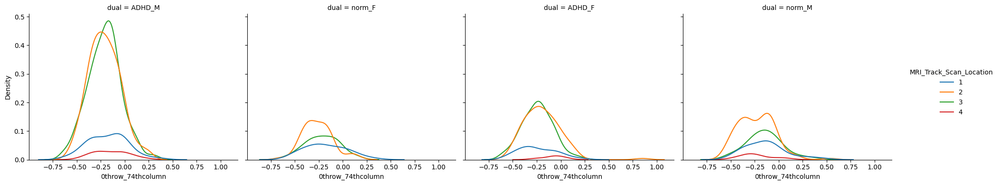

In [33]:
sns.displot(
    mriDF,
    x="0throw_74thcolumn",
    kind="kde",
    hue="MRI_Track_Scan_Location",
    col="dual",
    height=4,
    aspect=1.2,
    warn_singular=False,
);  # 9throw_42thcolumn

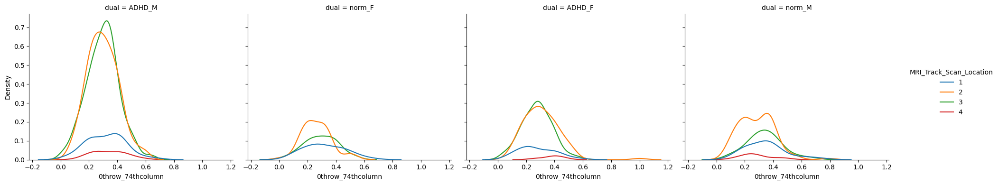

In [34]:
sns.displot(
    scaled_mriDF,
    x="0throw_74thcolumn",
    kind="kde",
    hue="MRI_Track_Scan_Location",
    col="dual",
    height=4,
    aspect=1.2,
    warn_singular=False,
);

### Using neuroCombat
[neuroComBat](https://github.com/Jfortin1/neuroCombat) for batch harmonization between institutions. ComBatLS uses similar methodology in an [R package](https://github.com/andy1764/ComBatFamily).

In [50]:
mriDF.head(5)

,participant_id,MRI_Track_Scan_Location,ADHD_Outcome,Sex_F,dual,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,00aIpNTbG5uh,3,1,0,ADHD_M,0.361339,0.791402,0.530706,0.623133,0.845830,...,-0.047477,-0.096450,-0.280312,0.037560,0.423037,0.242453,0.336213,0.402338,0.327915,0.539032
1,00fV0OyyoLfw,2,1,0,ADHD_M,0.051430,0.613198,0.635255,0.391237,0.451225,...,-0.143218,-0.276464,-0.332783,-0.332711,0.556939,0.475578,0.429196,0.457970,0.312571,0.595978
2,04X1eiS79T4B,2,0,1,norm_F,-0.305747,0.750316,-0.005342,0.458421,0.757530,...,-0.133778,-0.108588,-0.002132,-0.175586,0.679183,0.290292,0.486680,0.255208,0.575017,0.605182
3,05ocQutkURd6,2,0,1,norm_F,0.450442,0.731530,0.799147,0.701688,0.747468,...,-0.096647,-0.041420,-0.199576,-0.216457,0.519074,0.298586,0.415466,0.511607,0.361204,0.446613
4,06YUNBA9ZRLq,2,1,0,ADHD_M,0.415220,0.585700,0.355835,0.664142,0.683491,...,-0.158995,-0.274017,-0.141012,-0.002865,0.515169,0.336139,0.316430,0.442230,0.177079,0.378278


In [51]:
covars = mriDF[
    ["participant_id", "MRI_Track_Scan_Location", "ADHD_Outcome", "Sex_F", "dual"]
].set_index("participant_id")
batch_col = "MRI_Track_Scan_Location"
categorical_cols = ["ADHD_Outcome", "Sex_F"]

In [52]:
dat = mriDF[["participant_id"] + mri_cols].set_index("participant_id").T
dat.head(5)

participant_id,00aIpNTbG5uh,00fV0OyyoLfw,04X1eiS79T4B,05ocQutkURd6,06YUNBA9ZRLq,0cduHhwrQN4r,0FUWCjn9YMN1,0Hthz5IFXhpw,0hzWGU6XYSVp,0i2Tz2XUL4vm,...,ZuCLNLMndKHD,ZugkgQoYcfZP,Zusa1n9tQ3Yb,zW62ObiZfmKJ,zwBG0rZ05Mcb,zwjJWCRzKhDz,zwXD5v17Rx01,zWzLCi3NTBTd,Zy9GTHDxUbXU,Zye7yYRQohXi
0throw_1thcolumn,0.361339,0.051430,-0.305747,0.450442,0.415220,-0.107526,0.308091,0.524995,0.009082,0.254591,...,0.667497,0.120359,0.325016,0.406548,0.251472,0.068941,-0.045660,0.567587,0.428290,0.070158
0throw_2thcolumn,0.791402,0.613198,0.750316,0.731530,0.585700,0.705884,0.736951,0.703401,0.471080,0.628086,...,0.399224,0.744312,0.516233,0.737522,0.692684,0.447167,0.207386,0.727780,0.665262,0.736569
0throw_3thcolumn,0.530706,0.635255,-0.005342,0.799147,0.355835,0.353501,0.653909,0.557816,0.618640,0.326103,...,0.403751,0.765631,0.392028,0.652281,0.544077,0.418621,-0.140892,0.356171,0.748345,0.596468
0throw_4thcolumn,0.623133,0.391237,0.458421,0.701688,0.664142,0.355610,0.696388,0.709486,0.501222,0.301030,...,0.257467,0.405145,0.531414,0.615226,0.622913,0.371057,0.053852,0.420585,0.739051,0.667494
0throw_5thcolumn,0.845830,0.451225,0.757530,0.747468,0.683491,0.601175,0.872904,0.792200,0.394852,0.706037,...,0.295238,0.657554,0.711094,0.664160,0.658320,0.426226,0.204124,0.140959,0.677277,0.771569


In [53]:
dat.shape

(19900, 1210)

Corrected datasets to try:
- no ref batch, eb = True
- no ref batch, eb = False
- ref batch, eb = True
- ref batch, eb = False

In [54]:
harmon_dict = neuroCombat(
    dat=dat,
    covars=covars,
    batch_col=batch_col,
    categorical_cols=categorical_cols,
    eb=True,
    ref_batch=3,
)

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments


/Users/erinchinn/DataCats/notebooks/../utils/neuroCombat.py:324: RuntimeWarning:

divide by zero encountered in divide



[neuroCombat] Final adjustment of data


In [55]:
harmon_dict.keys()

dict_keys(['data', 'estimates', 'info'])

In [56]:
harmon_dict["data"].shape

(19900, 1210)

In [57]:
harmon_mriDF = pd.concat(
    [mriDF[label_cols], pd.DataFrame(data=harmon_dict["data"].T, columns=mri_cols)],
    axis=1,
)
harmon_mriDF.head(5)

,participant_id,ADHD_Outcome,Sex_F,dual,MRI_Track_Scan_Location,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,00aIpNTbG5uh,1,0,ADHD_M,3,0.361339,0.791402,0.530706,0.623133,0.845830,...,-0.047477,-0.096450,-0.280312,0.037560,0.423037,0.242453,0.336213,0.402338,0.327915,0.539032
1,00fV0OyyoLfw,1,0,ADHD_M,2,0.096115,0.577156,0.631844,0.343186,0.347925,...,-0.153306,-0.257403,-0.333827,-0.328998,0.576034,0.487602,0.446765,0.471691,0.308518,0.603282
2,04X1eiS79T4B,0,1,norm_F,2,-0.266231,0.719703,-0.018974,0.413967,0.709102,...,-0.144184,-0.099928,-0.005842,-0.179697,0.695000,0.302178,0.506355,0.259455,0.590891,0.612404
3,05ocQutkURd6,0,1,norm_F,2,0.502602,0.700229,0.799540,0.678639,0.697093,...,-0.107723,-0.036317,-0.201787,-0.218795,0.539163,0.310478,0.431999,0.528686,0.361362,0.454765
4,06YUNBA9ZRLq,1,0,ADHD_M,2,0.465988,0.548651,0.347553,0.640103,0.625134,...,-0.168799,-0.255085,-0.143512,-0.013458,0.535379,0.348059,0.329022,0.455163,0.163068,0.386859


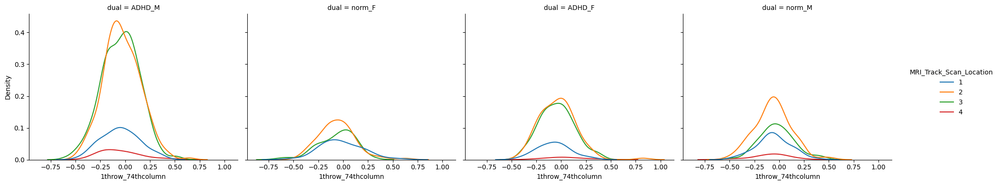

In [58]:
sns.displot(
    harmon_mriDF,
    x="1throw_74thcolumn",
    kind="kde",
    hue="MRI_Track_Scan_Location",
    col="dual",
    height=4,
    aspect=1.2,
    warn_singular=False,
);

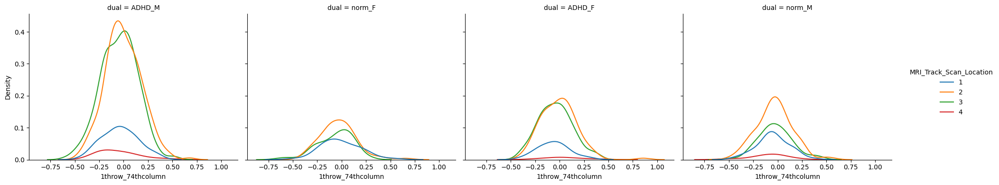

In [59]:
sns.displot(
    mriDF,
    x="1throw_74thcolumn",
    kind="kde",
    hue="MRI_Track_Scan_Location",
    col="dual",
    height=4,
    aspect=1.2,
    warn_singular=False,
);

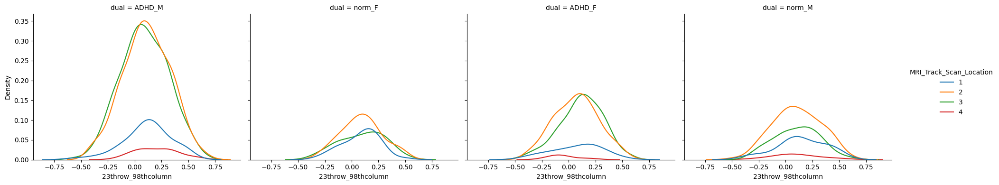

In [60]:
sns.displot(
    harmon_mriDF,
    x="23throw_98thcolumn",
    kind="kde",
    hue="MRI_Track_Scan_Location",
    col="dual",
    height=4,
    aspect=1.2,
    warn_singular=False,
);

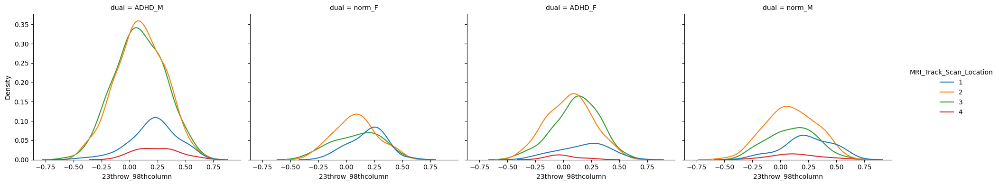

In [61]:
sns.displot(
    mriDF,
    x="23throw_98thcolumn",
    kind="kde",
    hue="MRI_Track_Scan_Location",
    col="dual",
    height=4,
    aspect=1.2,
    warn_singular=False,
);

In [62]:
mri_embed = pd.DataFrame(
    umap.UMAP(random_state=12, n_components=3).fit_transform(harmon_mriDF[mri_cols]),
    columns=["emb1", "emb2", "emb3"],
)

mri_embed[label_cols] = harmon_mriDF[label_cols]

fig = px.scatter_3d(
    mri_embed,
    x="emb1",
    y="emb2",
    z="emb3",
    color="MRI_Track_Scan_Location",
    opacity=0.6,
    hover_name="dual",
)
fig.update_traces(marker_size=4)
fig.show()

/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/erinchinn/DataCats/.venv/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



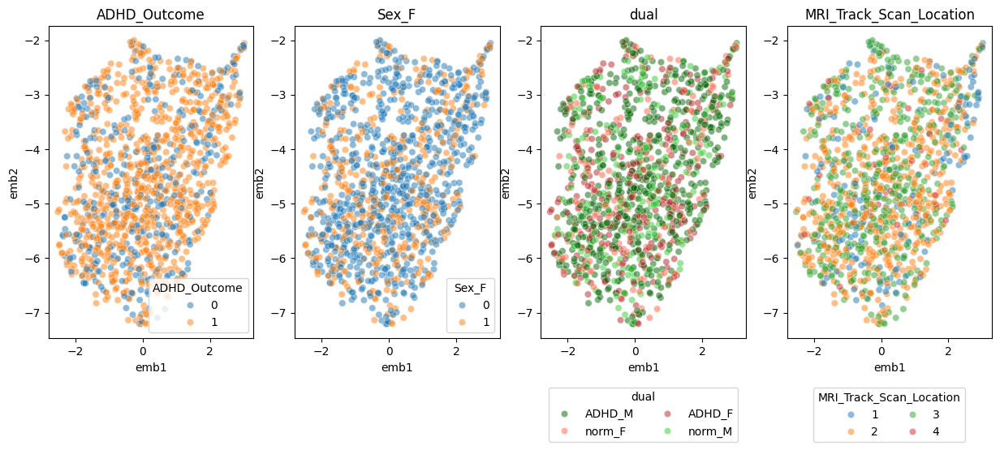

In [64]:
mri_embed = pd.DataFrame(
    umap.UMAP(random_state=12).fit_transform(harmon_mriDF[mri_cols]),
    columns=["emb1", "emb2"],
)

mri_embed[label_cols] = harmon_mriDF[label_cols]

fig, axs = plt.subplots(ncols=len(label_cols) - 1, figsize=(15, 5))
for i, label in enumerate(label_cols[1:]):
    if label == "dual":
        g = sns.scatterplot(
            data=mri_embed,
            x="emb1",
            y="emb2",
            hue=label,
            ax=axs[i],
            palette=palette_dual,
            alpha=0.5,
        )
    else:
        g = sns.scatterplot(
            data=mri_embed, x="emb1", y="emb2", hue=label, ax=axs[i], alpha=0.5
        )
    g.set_title(label)
    if i in [2, 3]:
        sns.move_legend(g, "lower center", bbox_to_anchor=(0.5, -0.35), ncol=2)

### Bone pile

In [65]:
# # median of each connectome score by dual label
# med_dual = scaled_mriDF.groupby(["dual"])[mri_cols].median().reset_index()
# med_dual

In [66]:
# # difference of each
# cols_diff_dual = (
#     abs(mean_adhd.loc[0, mri_cols] - mean_adhd.loc[1, mri_cols])
#     .sort_values(ascending=False)[:2600]
#     .index.to_list()
# )

In [67]:
# grouped_description = scaled_mriDF[mri_cols + ["dual"]].groupby("dual").describe()

# print(grouped_description)

#### feature correlation
- features correlated with gender or ADHD diagnosis

In [68]:
# top_corr_adhd = abs(mriDF[mri_cols].corrwith(mriDF["ADHD_Outcome"])).sort_values(ascending=False)[:40]
# top_corr_gender = abs(mriDF[mri_cols].corrwith(mriDF["Sex_F"])).sort_values(ascending=False)[:40]

In [69]:
# fig, ax = plt.subplots(figsize=(20,20))
# g = sns.heatmap(
#     mriDF[top_corr_gender.index.to_list() + ["Sex_F"]].corr(),
#     annot=True,
#     fmt=".1f",
#     cmap="coolwarm",
#     ax=ax)
# g.set_title("Correlation between gender label and MRI columns, highest 40 columns")
# plt.show()

In [70]:
# fig, ax = plt.subplots(figsize=(20,20))
# g = sns.heatmap(
#     mriDF[top_corr_adhd.index.to_list() + ["ADHD_Outcome"]].corr(),
#     annot=True,
#     fmt=".1f",
#     cmap="coolwarm",
#     ax=ax)
# g.set_title("Correlation between ADHD label and MRI columns, highest 40 columns")
# plt.show()

In [71]:
# meltedmriDF = mriDF[label_list + cols_diff_adhd[:30]].melt(
#     id_vars=label_list,
#     var_name="column",
#     value_name="value")

# g = sns.catplot(
#     data=meltedmriDF,
#     x="column",
#     y="value",
#     hue="dual",
#     kind="bar",
#     alpha=0.5,
#     height=5,
#     aspect=3,
#     # errorbar="sd",
#     errorbar=None,
#     palette=palette_dual,
#     hue_order=["norm_F", "ADHD_F", "norm_M", "ADHD_M"],
# )

# g.set_xticklabels(
#     rotation=45,
#     horizontalalignment="right"
# )